In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
# Git clone method (for development)
!git clone https://github.com/ultralytics/ultralytics
%pip install -e ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 55136, done.
remote: Counting objects: 100% (638/638), done.
remote: Compressing objects: 100% (382/382), done.
remote: Total 55136 (delta 463), reused 257 (delta 256), pack-reused 54498 (from 3)
Receiving objects: 100% (55136/55136), 31.21 MiB | 19.57 MiB/s, done.
Resolving deltas: 100% (40701/40701), done.
Obtaining file:///kaggle/working/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.102-0.editable-py3-none-any.whl size=23154 sha256=14ad4a99a7a9b228280e2036d93ae0de97b3a0e10f9312a81458527f4f5957be
  Stored in directory: /tmp/pip-ephem-wheel-cache-j2npolme/wheels/1b/eb/7d/853f2df0532389050170c8cd117b40e1fef8d125854a910fe6
Successfully buil

In [3]:
!pip3 uninstall wandb -y

Found existing installation: wandb 0.19.1
Uninstalling wandb-0.19.1:
  Successfully uninstalled wandb-0.19.1


In [4]:
!yolo task=detect mode=train model=yolov9s.pt data="/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml" epochs=30 imgsz=640 plots=True device=0 verbose=True cos_lr=True 

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100%|██████████████████████████████████████| 14.7M/14.7M [00:00<00:00, 49.6MB/s]
Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_s

In [5]:
!yolo task=detect mode=val model="/kaggle/working/ultralytics/runs/detect/train/weights/best.pt" data="/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml"

Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9s summary (fused): 197 layers, 7,172,506 parameters, 0 gradients, 26.8 GFLOPs
val: Scanning /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yol
val: WARNING ⚠️ Cache directory /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        800       2877      0.931      0.906      0.945      0.841
                  trak        113        120      0.954      0.992      0.993      0.952
               cyclist        188        234      0.884      0.814      0.877      0.721
                  bike        340        486      0.945       0.89       0.95      0.787
                 tempo        123        134      0.943       0.91       0.96      0.881
                   car        307        524      0.933      0.895     

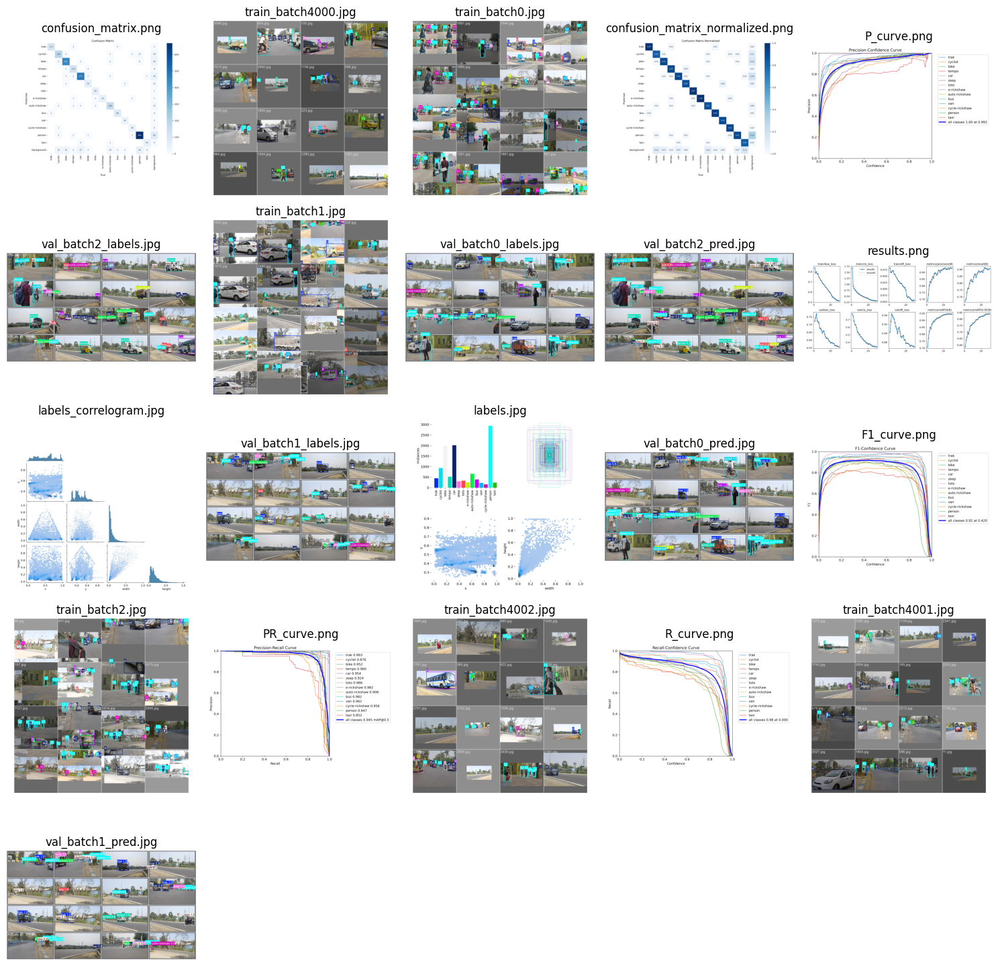

In [6]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path

def display_images_from_folder(folder_path):
    """
    Finds and displays all .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List to store images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Plotting images
    plt.figure(figsize=(15, 15))
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(5, 5, i+1)  # Adjust the grid size (5, 5) as needed
        plt.imshow(image_rgb)
        plt.title(image_file)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
display_images_from_folder("/kaggle/working/ultralytics/runs/detect/train")

In [7]:
# Run inference on an image with YOLOv8n
!yolo predict model="/kaggle/working/ultralytics/runs/detect/train/weights/best.pt" source="/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images"

Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9s summary (fused): 197 layers, 7,172,506 parameters, 0 gradients, 26.8 GFLOPs

image 1/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3201.jpg: 384x640 1 bike, 66.2ms
image 2/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3202.jpg: 384x640 1 cyclist, 1 car, 1 person, 17.1ms
image 3/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3203.jpg: 384x640 1 cyclist, 1 bike, 2 cars, 4 auto-rickshaws, 4 persons, 2 taxis, 17.1ms
image 4/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3204.jpg: 384x640 1 bike, 1 zeep, 16.9ms
image 5/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3205.jpg: 384x640 1 bike, 16.8ms
image 6/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/

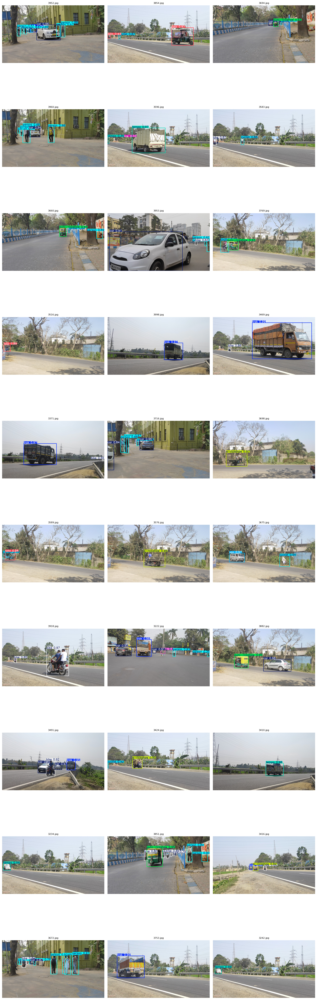

In [8]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path
def display_random_images_from_folder(folder_path, num_images=30):
    """
    Finds and displays a random selection of .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List all valid images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Randomly select images (up to num_images)
    num_images = min(num_images, len(image_files))  # In case there are fewer than 30 images
    selected_images = random.sample(image_files, num_images)

    # Grid setup
    grid_rows = 10  # Adjust based on num_images
    grid_cols = 3
    plt.figure(figsize=(15, 5*grid_rows))  # Adjust figure size

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
display_random_images_from_folder("/kaggle/working/ultralytics/runs/detect/predict")